In [1]:
import sys
sys.path.append('..')

from EBC import EBC

In [2]:
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np

from rdkit import Chem
from rdkit.Chem import AllChem

In [5]:
N = 2500

SMILE = "CC(C)CC(C(=O)O)N"
SYSTEM_NAME = 'leucine'

mol = Chem.MolFromSmiles(SMILE)
mol = Chem.AddHs(mol)

In [31]:
# Use RDKit:
# - Conformation Generation
# - Alignment
# - Calculate Energy/Relax (check maxIters)
AllChem.EmbedMultipleConfs(mol, numConfs=N, useExpTorsionAnglePrefs=False, useBasicKnowledge=True) 
AllChem.AlignMolConformers(mol, atomIds=list(range(mol.GetNumHeavyAtoms())), reflect=True)
conformations_all = np.array([x.GetPositions() for x in mol.GetConformers()])
conformations = conformations_all[:, :mol.GetNumHeavyAtoms()]
conv, energy = np.split(np.array(AllChem.MMFFOptimizeMoleculeConfs(mol, maxIters=0)), 2, axis=-1)
conformations.shape

(2500, 9, 3)

In [32]:
ebc = EBC(temperature=100, proto_radius=0.1, n_clusters=5, pca_components=2) 
ebc.fit(conformations, energy)

Using 2 components, explaining 46.9% of variance
Using 824 proto clusters.
Using the eigenvector corresponding to an eigenvalue of 0.9999999999999999.


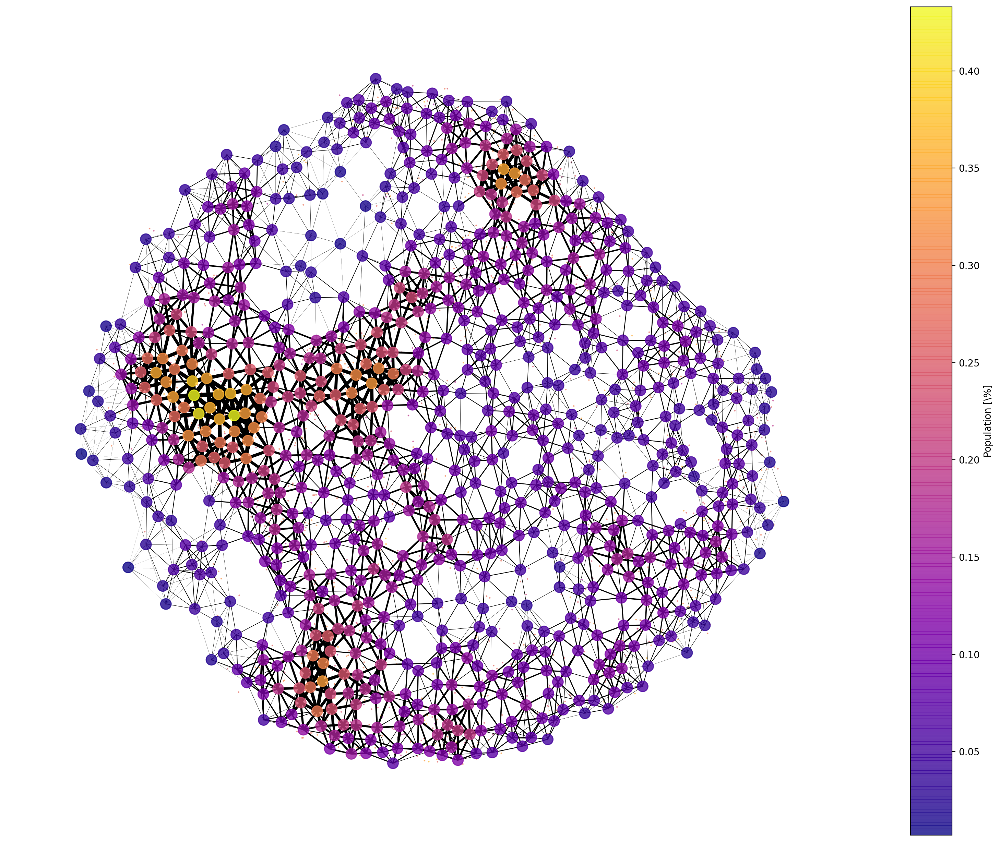

In [33]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=1, show_labels=False)

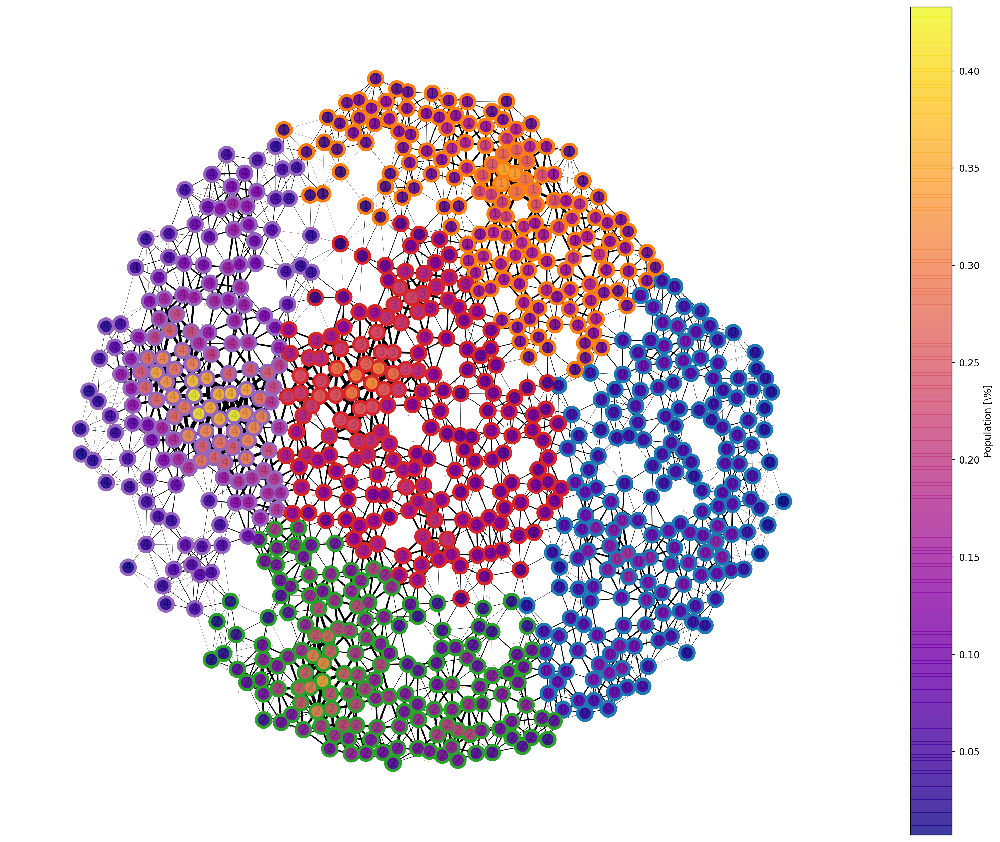

In [34]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=1, show_labels=True)

In [25]:
ebc.extract_clusters(n_clusters=6)

Using the eigenvector corresponding to an eigenvalue of 1.0000000000000038.


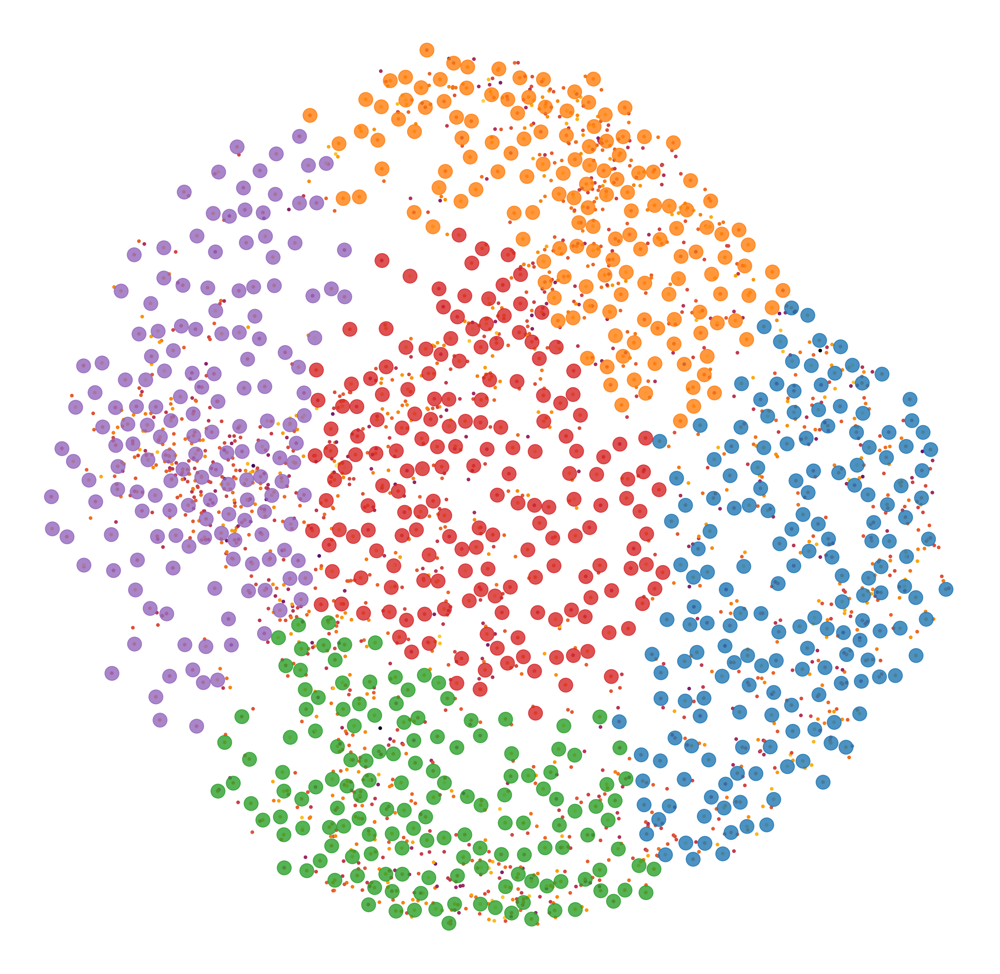

In [35]:
ebc.show();

In [28]:
# Save conformations of highest populated state of each cluster as xyz
ebc.write_clusters(mol)

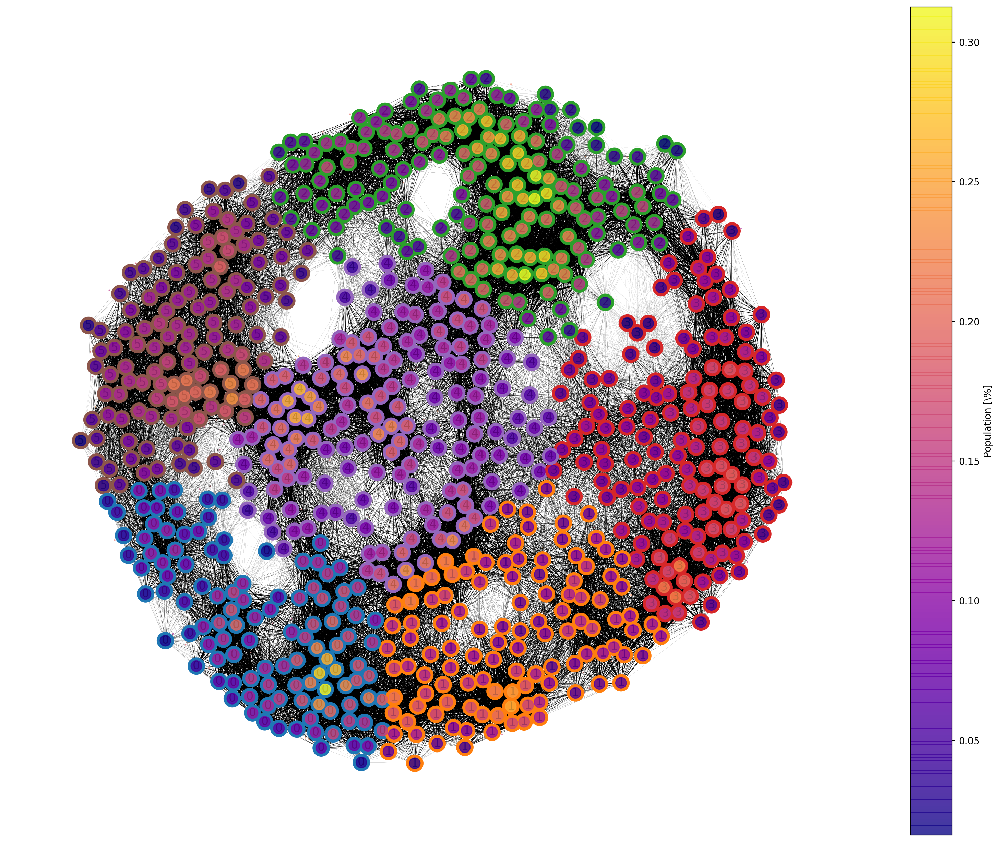

In [30]:
# Shows the corresponding labels
ebc.plot_graph(tau=10, show_labels=True)